# Задача 2

#### Рассмотрим задачу о наргевании балки, бесконечной по одной оси координат (𝑂𝑧). Получить численное решение стационарной задачи теплопроводности:

## $$\frac{d^2u}{dx^2} + \frac{d^2u}{dy^2} = 0$$

### Рассмотреть случаи:

#### 1. Квадратное сечение балки. Температура грани AB 20 градусов, грани BC 40 градусов, грани CD 80 градусов, грани AD 120 градусов, длина грани 𝐿 = 0.5 м

#### 2. Кругового сечения с радиусом 𝑟 = 1 м и температурой на границе 120 градусов.

### Используем итерационный метод Якоби:
    
## $$\frac{u_{m-1, l}^{i+1} - 2u_{m,l}^{i+1} + u_{m+1,l}^{i}}{h_x^2} + \frac{u_{m, l-1}^{i+1} - 2u_{m,l}^{i+1} + u_{m,l+1}^{i}}{h_y^2} = 0 = \frac{u_{m,l}^{i+1} - u_{m,l}^{i}}{\alpha \tau}$$

### И квадратное и круглое сечение решаем одним способом, с разными начальными условиями.

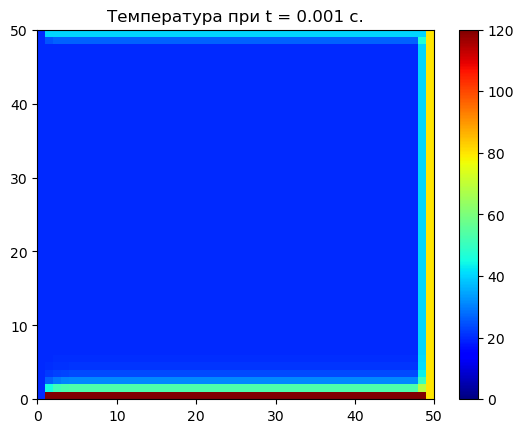

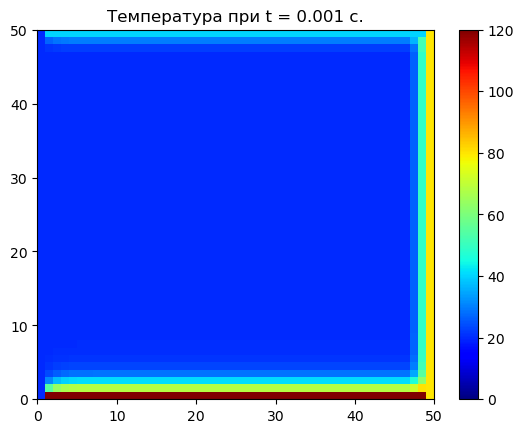

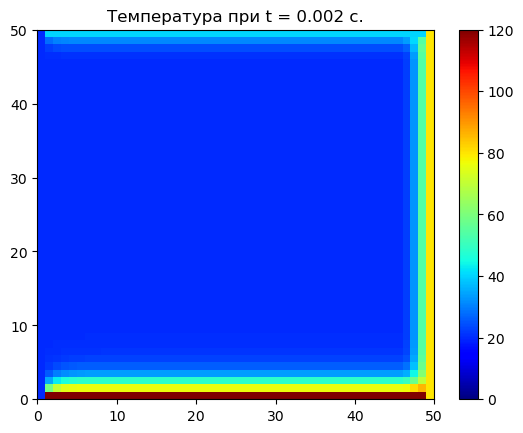

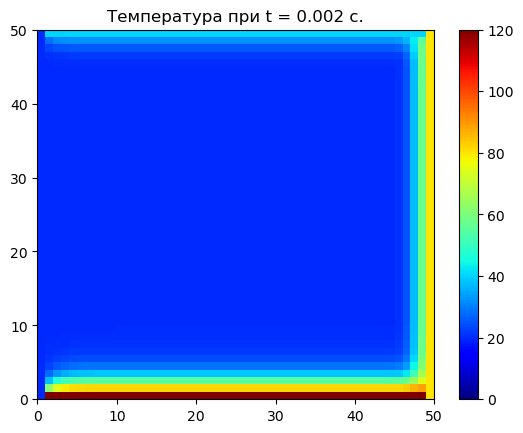

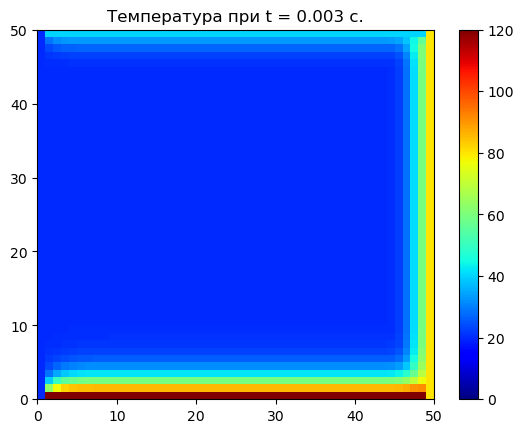

...

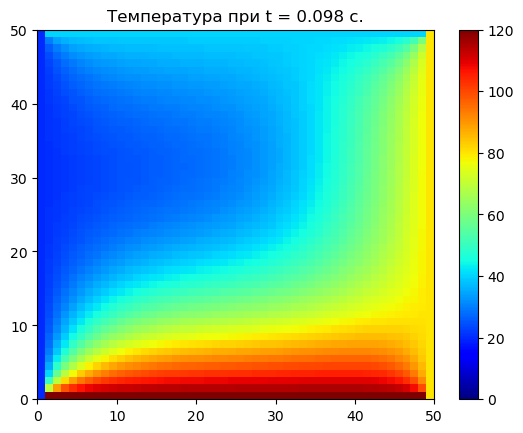

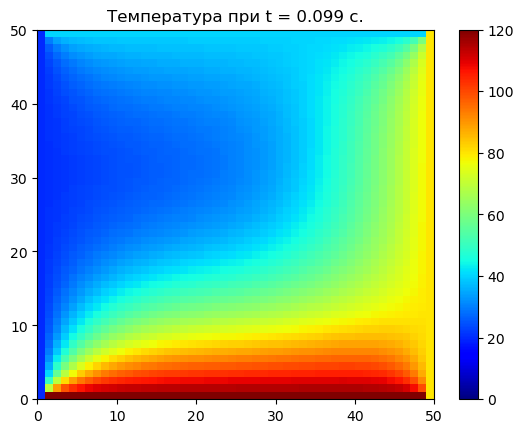

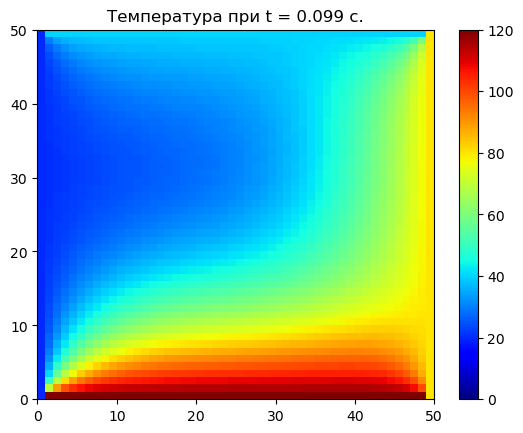

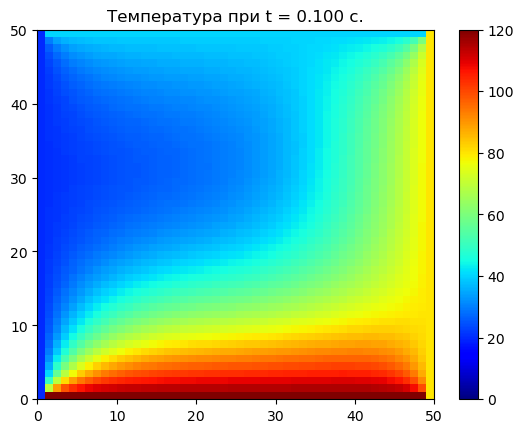

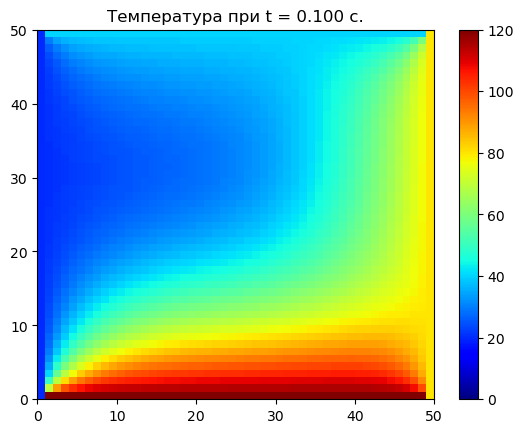

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imageio.v2 as imageio

a = 500
Length = 50
StopTime = 0.1
DimSize = 50

hx = Length / DimSize
hy = Length / DimSize
Tau = min(hx**2 / (4 * a), hy**2 / (4 * a))

TempAB = 20
TempBC = 40
TempCD = 80
TempAD = 120
InTemp = 20

def main():
    # Начальная температура всей палки внутри -- 20
    U = np.zeros((DimSize, DimSize)) + InTemp

    # Граничные условия
    U[0, :] = TempAD
    U[-1, :] = TempBC

    U[:, 0] = TempAB
    U[:, -1] = TempCD

    # Массив картинок на каждой итерации для создания гифки
    Images = []
    CurrTime = 0
    # Директория для гифки
    GifDir = '/home/dobrovolskaya/Desktop/VichMati/Pics'
    GifName = GifDir + '/TempSq.gif'

    while CurrTime < StopTime :
        fig, axis = plt.subplots()

        ColorMesh = axis.pcolormesh(U, cmap=plt.cm.jet, vmin=0, vmax=max(TempAB, TempBC, TempCD, TempAD))
        plt.colorbar(ColorMesh, ax=axis)

        PrevU = U.copy()

        for m in range(1, DimSize - 1):
            for l in range(1, DimSize - 1):
                Uxx = (U[m - 1, l] - 2 * U[m, l] + PrevU[m + 1, l]) / hx**2
                Uyy = (U[m, l - 1] - 2 * U[m, l] + PrevU[m, l + 1]) / hy**2
                U[m, l] = Tau * a * (Uxx + Uyy) + PrevU[m, l]

        CurrTime += Tau
        ColorMesh.set_array(U)    

        axis.set_title("Tемпературa при t = {:.3f} с.".format(CurrTime))
        plt.savefig(GifDir + '/Temp.png')
        plt.pause(0.01)
        Images.append(imageio.imread(GifDir + '/Temp.png'))
        plt.close(fig)

    imageio.mimsave(GifName, Images)

    
if __name__ == '__main__':
    main()

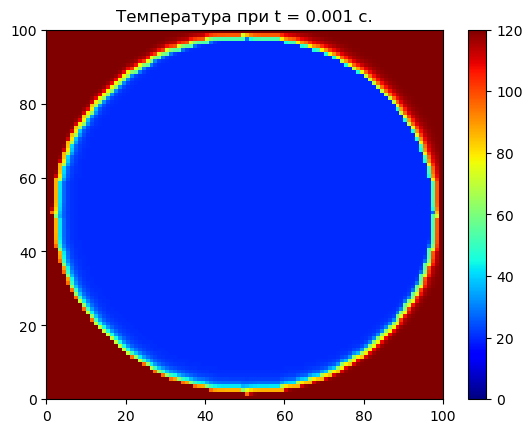

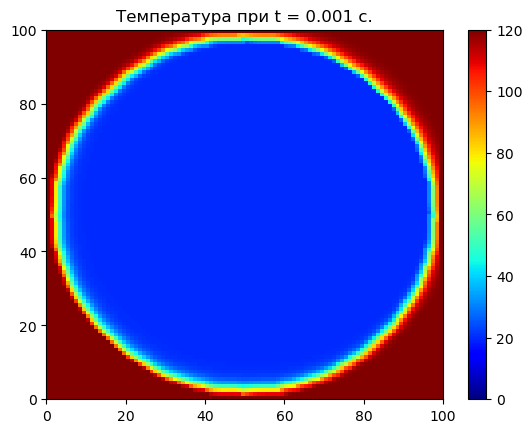

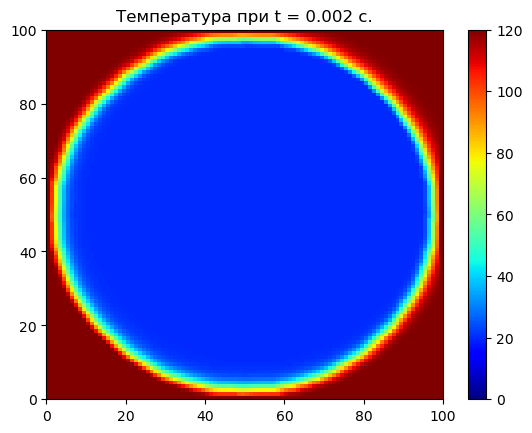

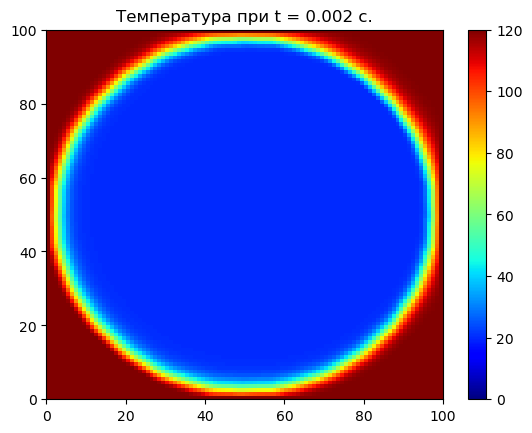

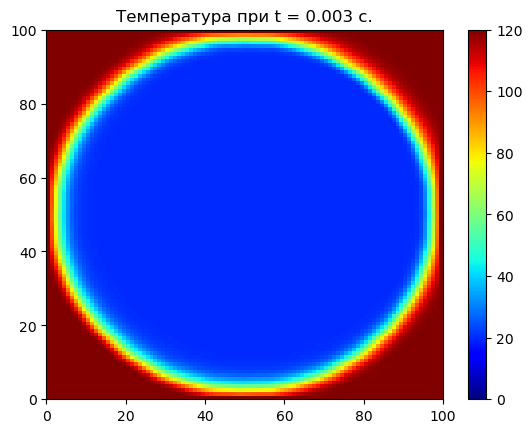

...

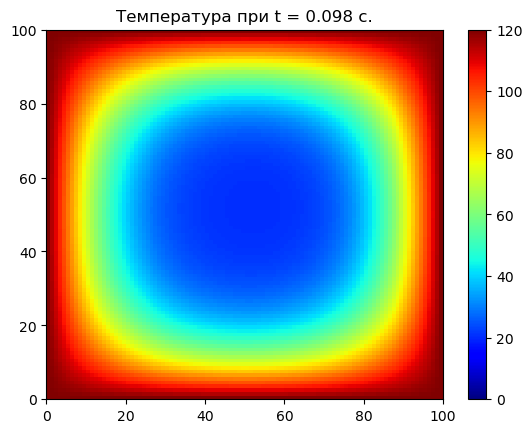

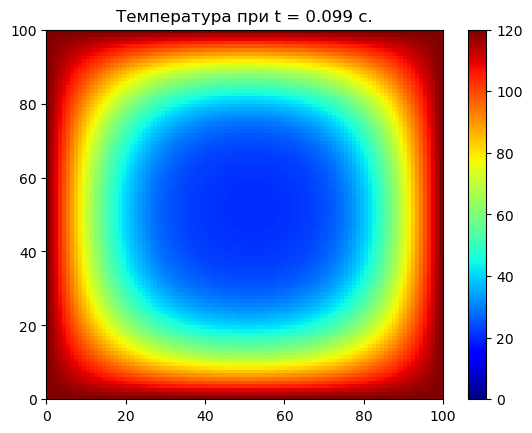

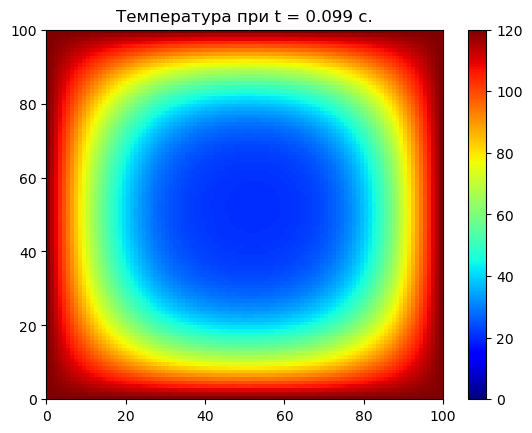

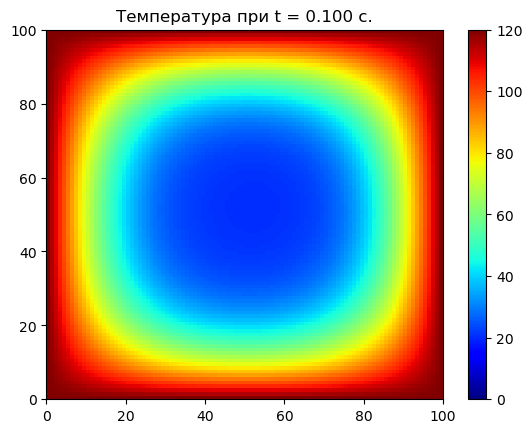

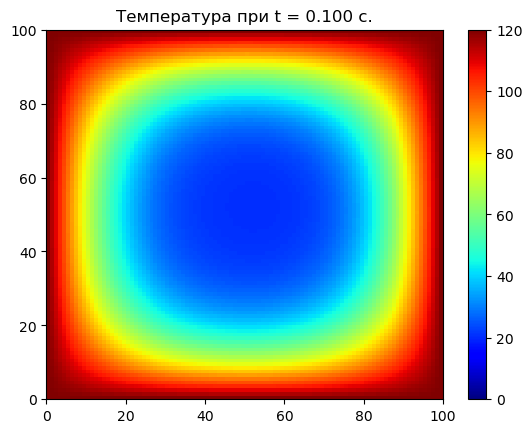

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imageio.v2 as imageio

a = 500
Length = 100
StopTime = 0.1
DimSize = 100

hx = Length / DimSize
hy = Length / DimSize
Tau = min(hx**2 / (4 * a), hy**2 / (4 * a))

# Центр круга
X0 = Length / 2
Y0 = Length / 2

InTemp = 20
OutTemp = 120

def main():
    # Начальная температура всей палки внутри -- 20
    U = np.zeros((DimSize, DimSize)) + InTemp

    # Граничные условия: всё, что снаружи круга -- 120
    for X in range(DimSize):
        for Y in range(DimSize):
            if ((X - X0)**2 + (Y - Y0)**2 > (Length / 2 - 2)**2):
                U[X, Y] = 120

    # Массив картинок на каждой итерации для создания гифки
    Images = []
    CurrTime = 0
    # Директория для гифки
    GifDir = '/home/dobrovolskaya/Desktop/VichMati/Pics'
    GifName = GifDir + '/TempCir.gif'

    while CurrTime < StopTime :
        fig, axis = plt.subplots()

        ColorMesh = axis.pcolormesh(U, cmap=plt.cm.jet, vmin=0, vmax=max(InTemp, OutTemp))
        plt.colorbar(ColorMesh, ax=axis)

        PrevU = U.copy()

        for m in range(1, DimSize - 1):
            for l in range(1, DimSize - 1):
                Uxx = (U[m - 1, l] - 2 * U[m, l] + PrevU[m + 1, l]) / hx**2
                Uyy = (U[m, l - 1] - 2 * U[m, l] + PrevU[m, l + 1]) / hy**2
                U[m, l] = Tau * a * (Uxx + Uyy) + PrevU[m, l]

        CurrTime += Tau
        ColorMesh.set_array(U)    

        axis.set_title("Tемпературa при t = {:.3f} с.".format(CurrTime))
        plt.savefig(GifDir + '/Temp.png')
        plt.pause(0.01)
        Images.append(imageio.imread(GifDir + '/Temp.png'))
        plt.close(fig)

    imageio.mimsave(GifName, Images)

    
if __name__ == '__main__':
    main()